In [330]:
%matplotlib inline
import numpy as np
from ipywidgets import interact, widgets
import csv
import os
import glob
from IPython.display import Image, display
import matplotlib.image as mpimg
import pandas as pd
import matplotlib.pyplot as plt
import matchflare
from FINDflare import FINDflare as ff
import morestuff as ms
from scipy.optimize import curve_fit
from scipy.stats import chisquare as chi
import tables as pt
import ModelFlare as mf

In [331]:
def coords(path_csv, mypath='/epyc/data/ztf_matchfiles'):
    match_all = pd.read_csv(path_csv, header=None)
    #only doing the first row to start small
    match = match_all.values[0]
    matchfile = mypath + match[0][1:]
    sources, sourcedata, transients, transientdata = model.loaddata(matchfile)
    ra = sourcedata['ra']
    dec = sourcedata['dec']
    matchid = sourcedata['matchid']
    dfout = pd.DataFrame(data={'matchid':matchid,'ra':ra,'dec':dec})
    return dfout
    #dfout.to_csv(match[0].split('/')[-1][:-8] + '_coords.csv')


In [244]:
#file_24 = "/epyc/data/ztf_matchfiles/partnership/ztfweb.ipac.caltech.edu/rc24/fr000401-000450/ztf_000436_zr_c07_q1_match_programid2.pytable"
#s_24 = matchflare.loaddata(file_24)[1]
#lc = s_24[s_24["matchid"] == 163553]
#file_12 = "/epyc/data/ztf_matchfiles/partnership/ztfweb.ipac.caltech.edu/rc12/fr000401-000450/ztf_000437_zr_c04_q1_match_programid2.pytable"
file_12 = "/epyc/data/ztf_matchfiles/partnership/ztfweb.ipac.caltech.edu/rc12/fr000401-000450/ztf_000436_zr_c04_q1_match_programid2.pytable"
s_12 = matchflare.loaddata(file_12)[1]
lc_f = s_12[s_12["matchid"] == 137953]

In [28]:
df = coords('Matchfile_paths/436.txt')

In [44]:
df[:100].to_csv('coords.csv')

In [70]:
stats_436 = pd.read_csv('found_flares_436/stats_ztf_000436_final_3.csv')
stats_437 = pd.read_csv('found_flares_437/stats_ztf_000437.csv')

3072.2309999999998 3080.406


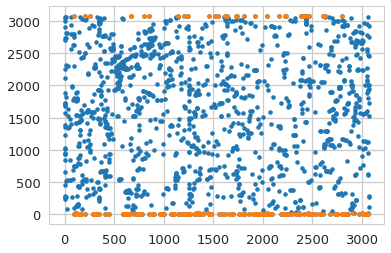

In [72]:
edge_436 = stats_436.loc[((stats_436["ypos"] <= 10) | (stats_436['ypos'] > 3075))]  
plt.plot(stats_436['xpos'],stats_436['ypos'], linestyle='none', marker='.')
plt.plot(edge_436['xpos'],edge_436['ypos'], linestyle='none', marker='.')
print(np.max(stats_436['xpos']),np.max(stats_436['ypos'])) 

3042.808 3080.4759999999997


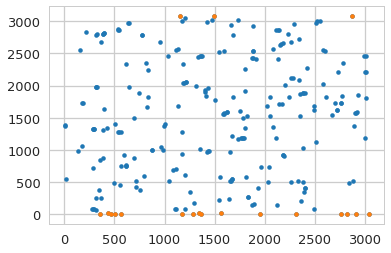

In [73]:
edge_437 = stats_437.loc[((stats_437["ypos"] <= 10) | (stats_437['ypos'] > 3075))]  
plt.plot(stats_437['xpos'],stats_437['ypos'], linestyle='none', marker='.')
plt.plot(edge_437['xpos'],edge_437['ypos'], linestyle='none', marker='.')
print(np.max(stats_437['xpos']),np.max(stats_437['ypos'])) 

(array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        2., 8.]),
 array([58347.2242824 , 58347.23999106, 58347.25569973, 58347.27140839,
        58347.28711706, 58347.30282572, 58347.31853439, 58347.33424305,
        58347.34995171, 58347.36566038, 58347.38136904, 58347.39707771,
        58347.41278637, 58347.42849504, 58347.4442037 , 58347.45991236,
        58347.47562103, 58347.49132969, 58347.50703836, 58347.52274702,
        58347.53845569, 58347.55416435, 58347.56987301, 58347.58558168,
        58347.60129034, 58347.61699901, 58347.63270767, 58347.64841634,
        58347.664125  , 58347.67983366, 58347.69554233, 58347.71125099,
        58347.72695966, 58347.74266832, 58347.75837699, 58347.77408565,
        58347.78979431, 58347.

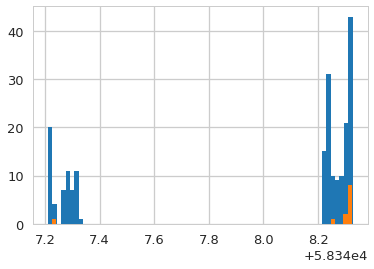

In [74]:
plt.hist(stats['flare_time'], bins=70)
plt.hist(edge['flare_time'], bins=70)

In [303]:
def veiwlimitedcurves(statscsv, path='found_flares_436/'):
    stats = pd.read_csv(statscsv)
    statslim = stats.loc[((stats["chi_flare"] <= 100) & (stats['red_flare'] + 1 < stats['red_gauss']) & 
                          ((stats["ypos"] >= 10) | (stats['ypos'] < 3075)) & 
                          ((stats['end_time'] - stats['flare_time']) > 0.01) &
                          (stats['dof_flare'] > 15))]  
    for i in range(len(statslim['id'])):
        filepath = path + statslim['match_file'].values[i] + '_id_' + str(statslim['id'].values[i]) + '*.png'
        filepath = glob.glob(filepath)
        for j in filepath:
            display(Image(filename=j))

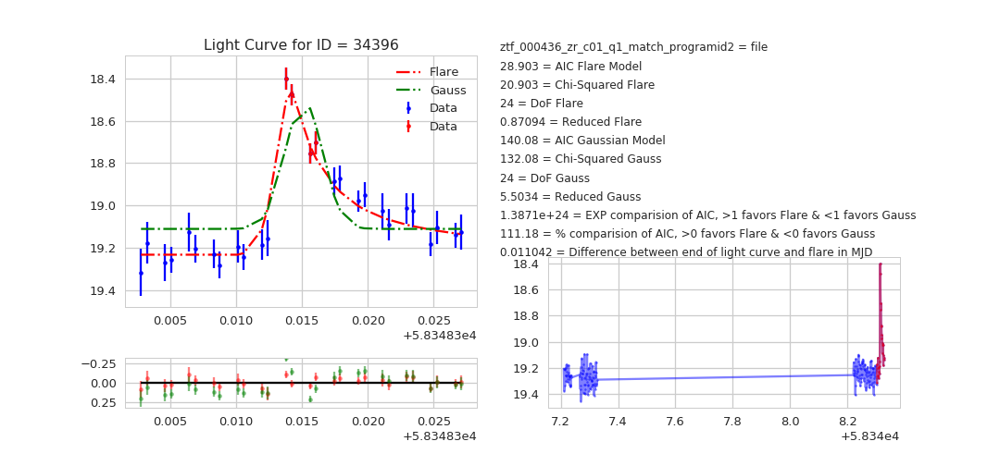

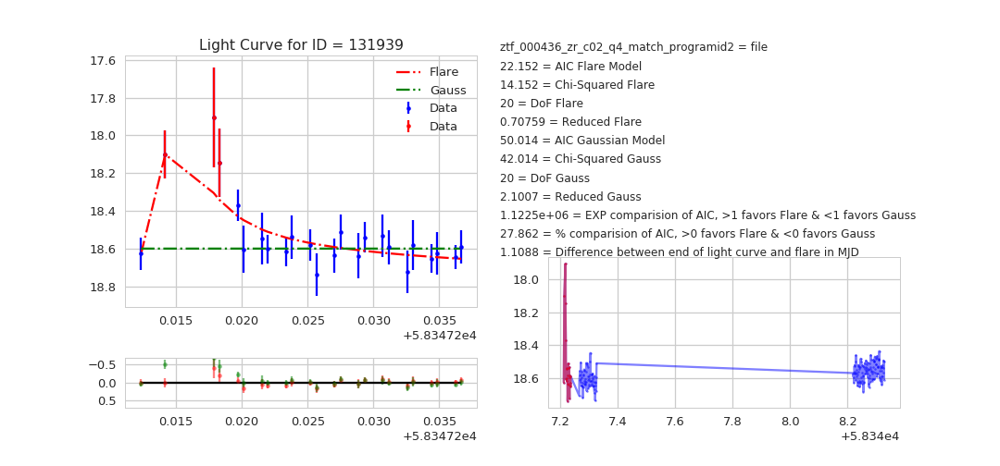

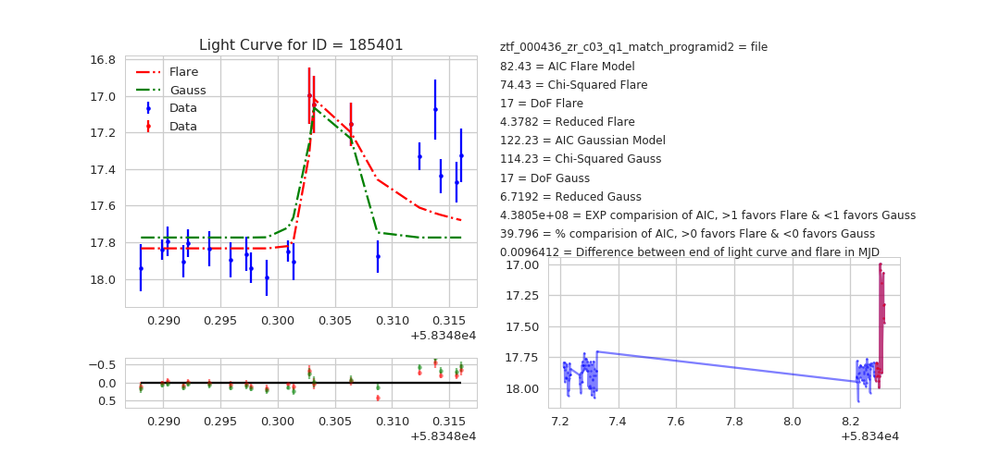

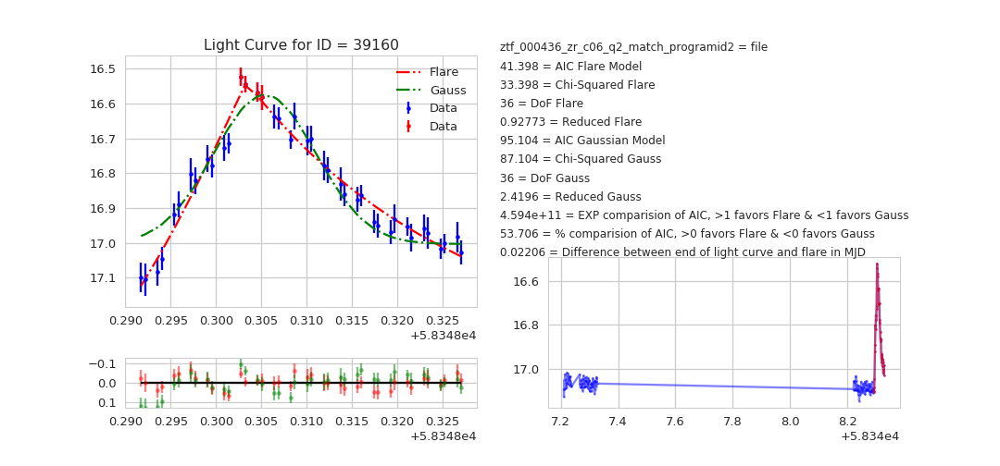

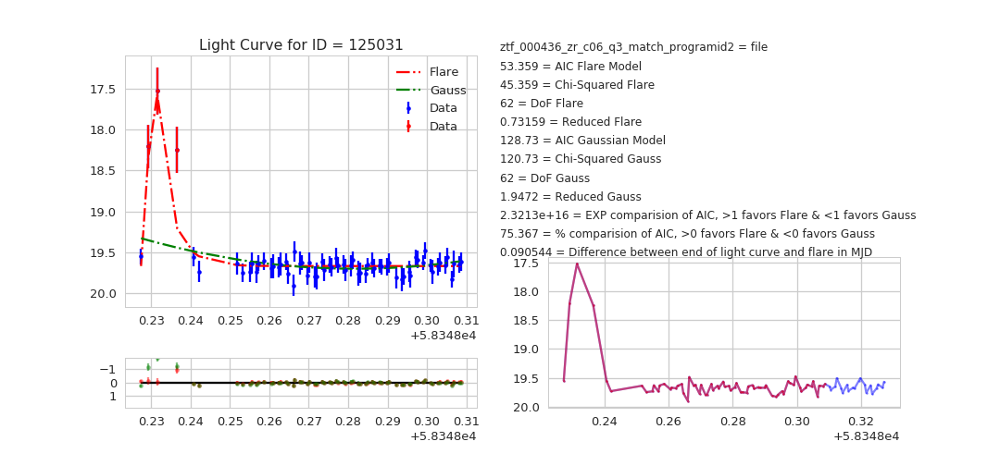

...

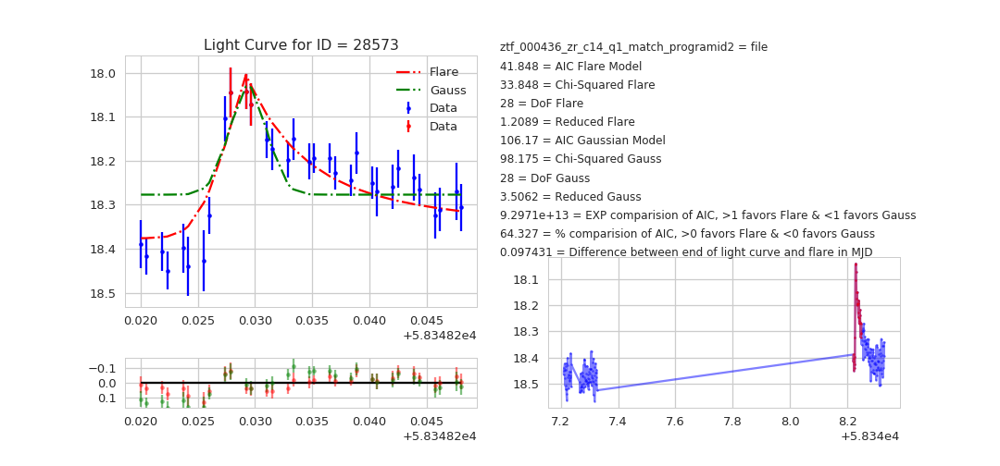

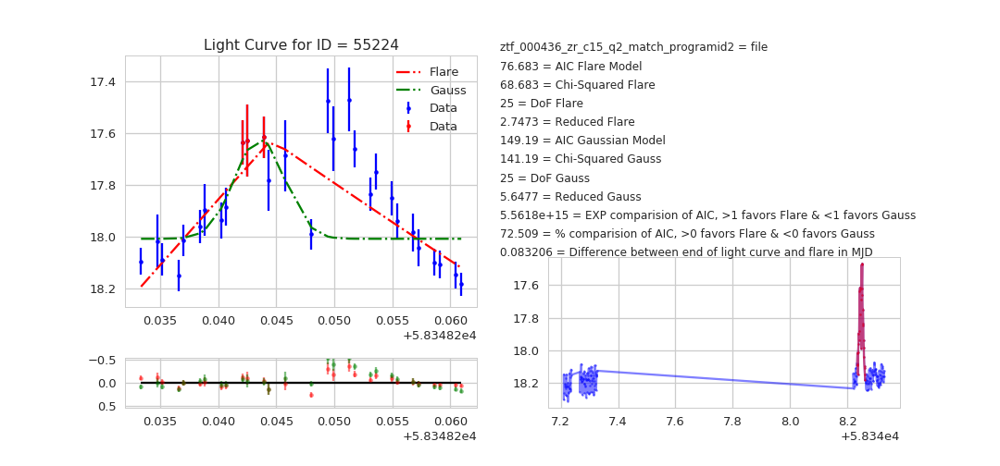

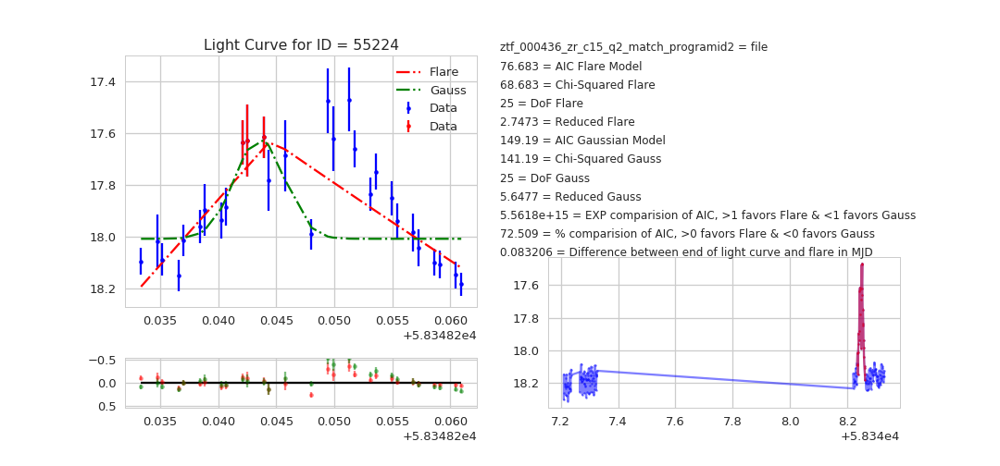

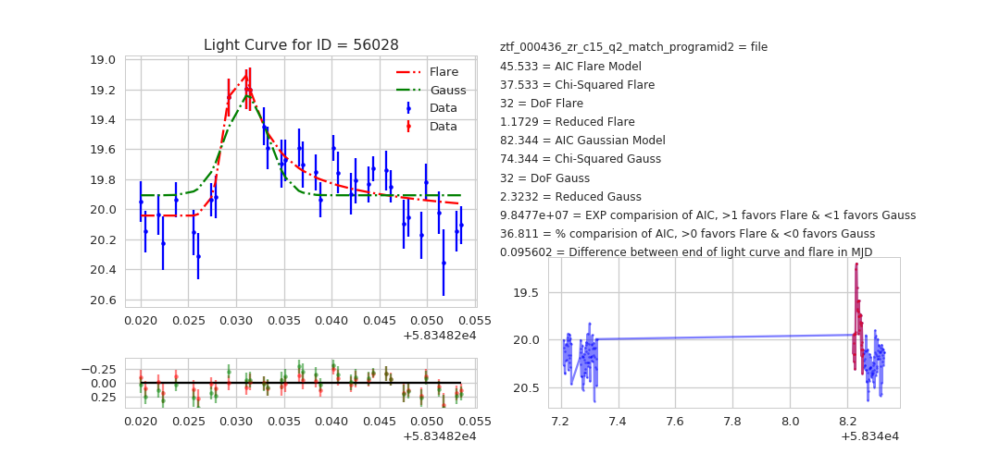

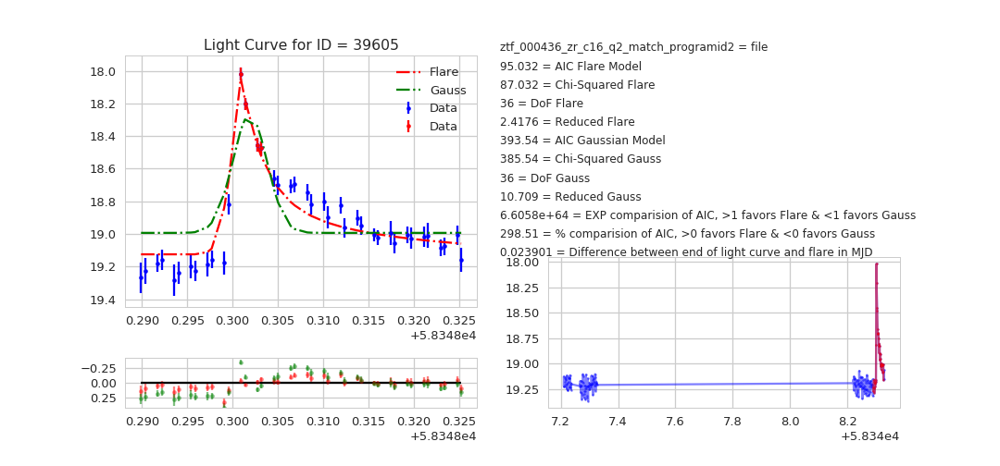

In [314]:
veiwlimitedcurves('found_flares_436/stats_ztf_000436.csv')

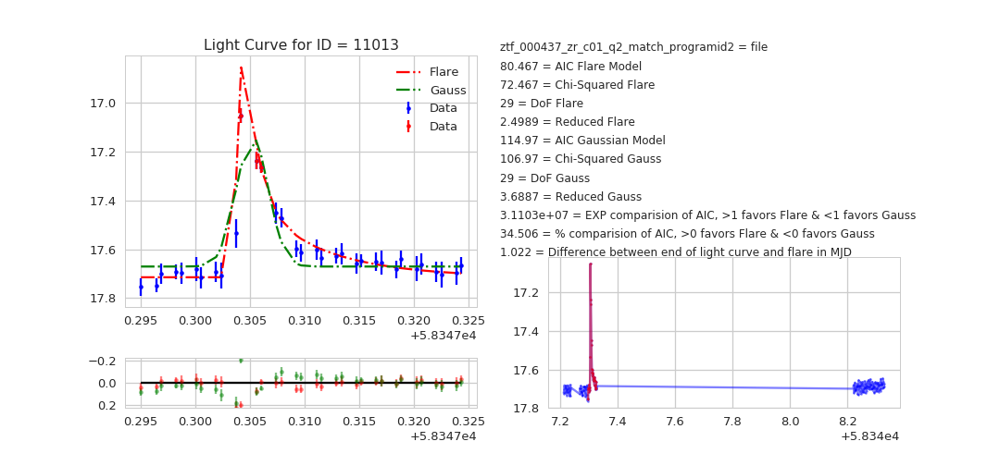

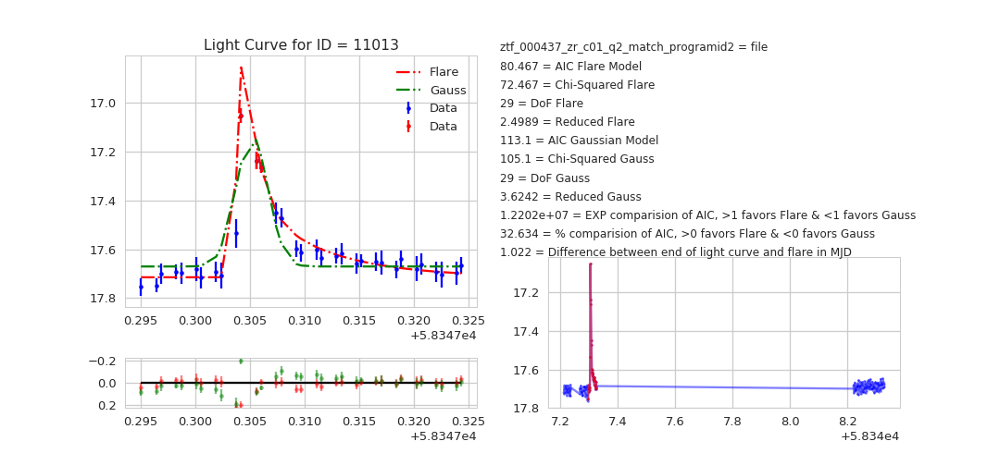

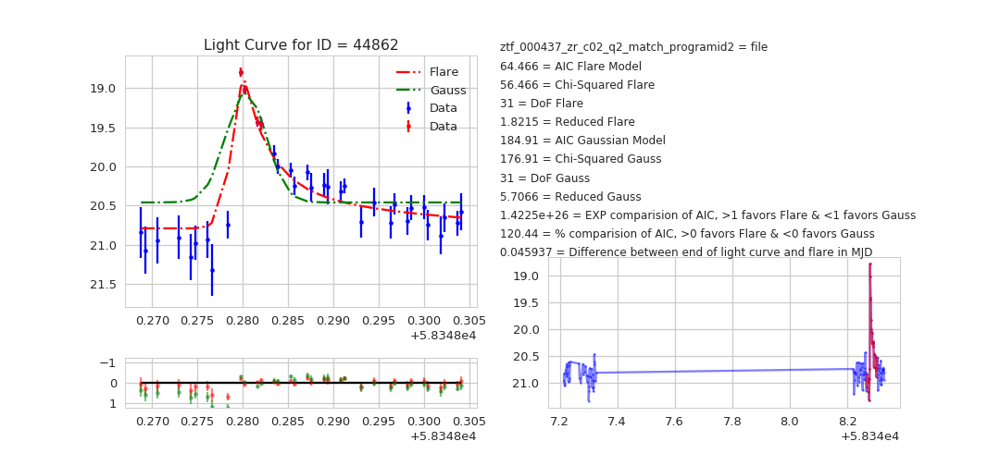

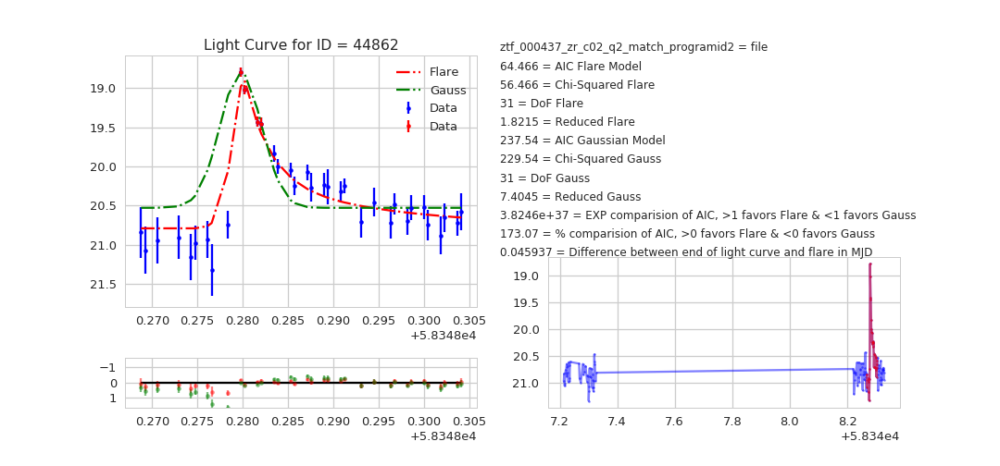

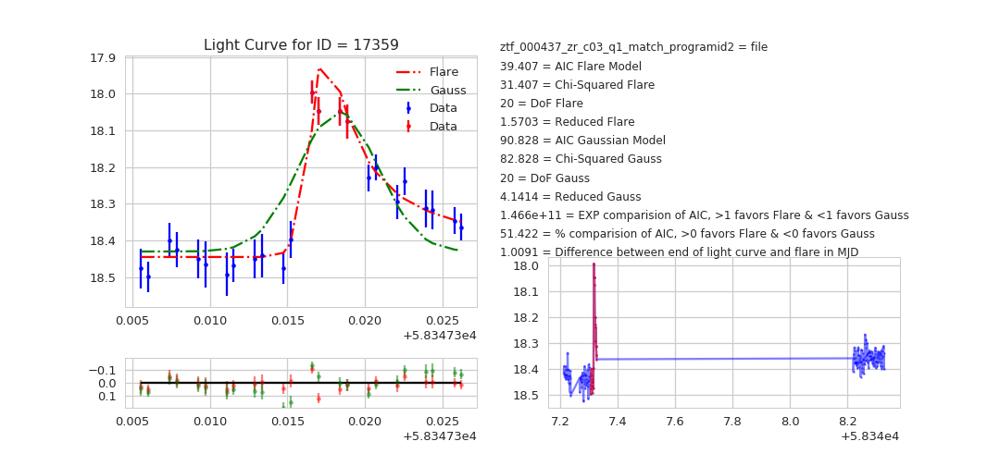

...

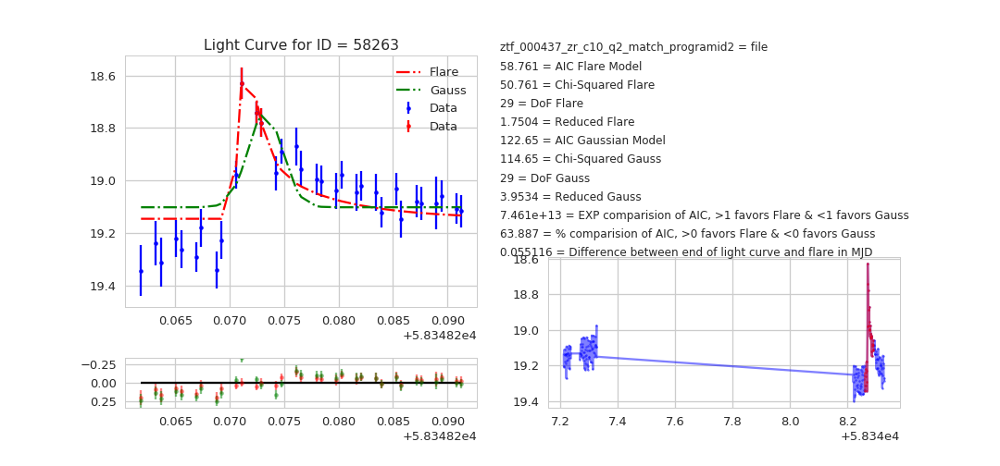

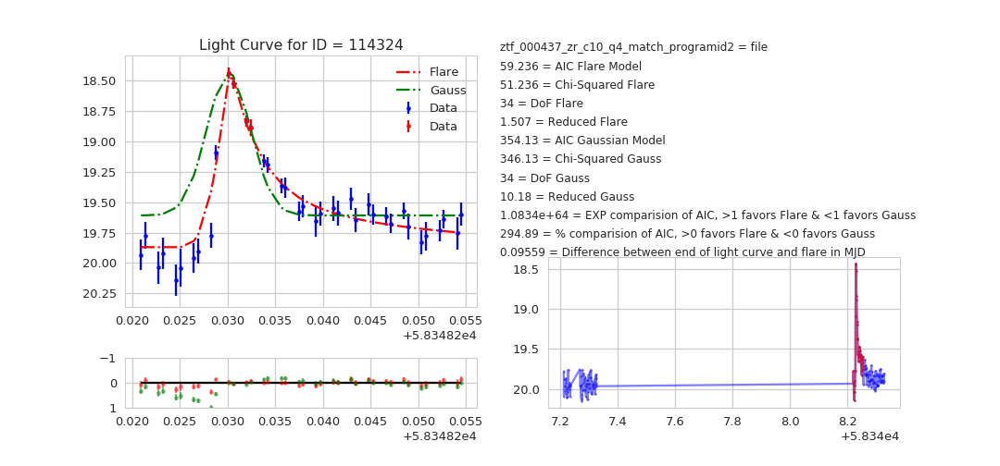

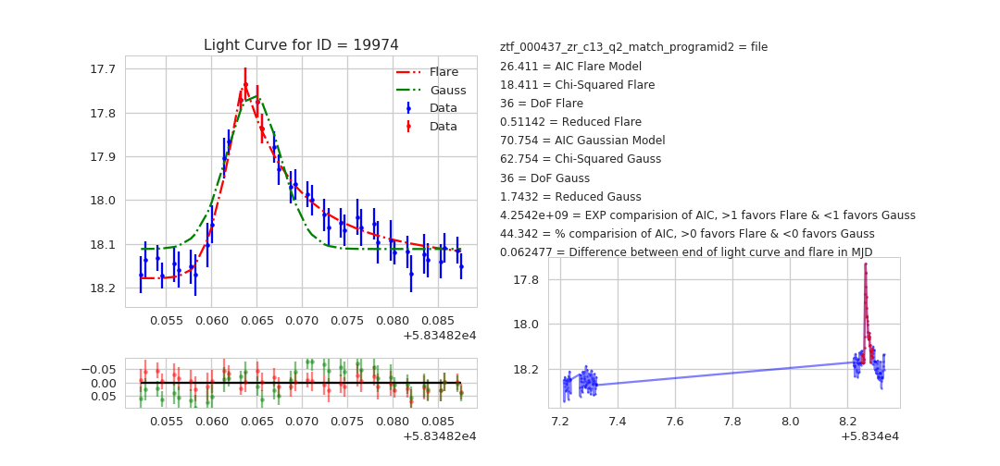

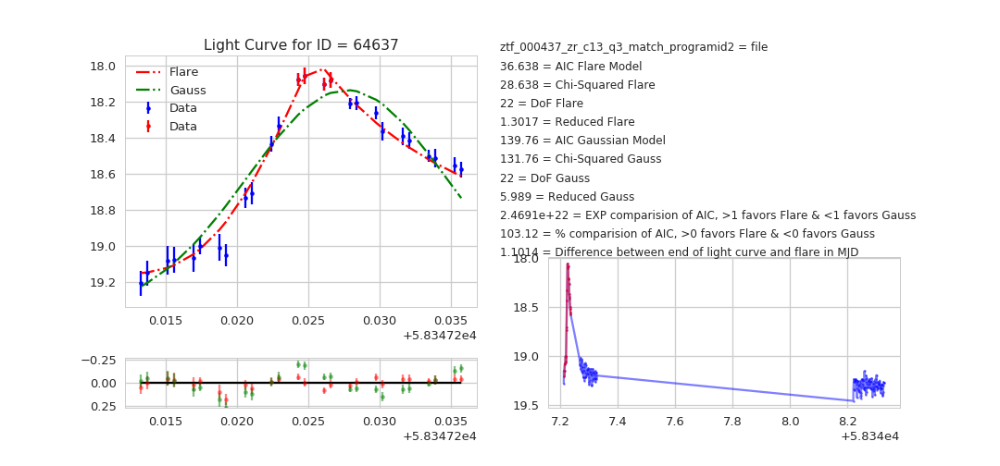

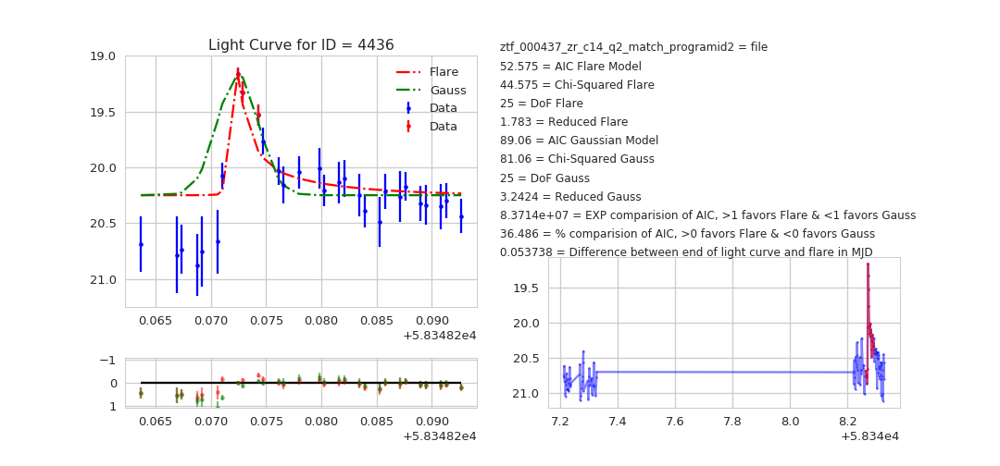

In [315]:
veiwlimitedcurves('found_flares_437/stats_ztf_000437.csv',path='found_flares_437/')

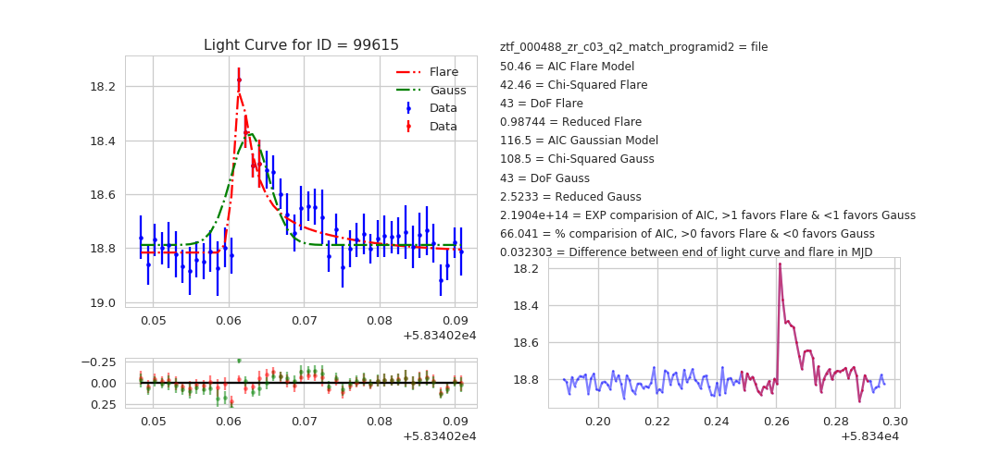

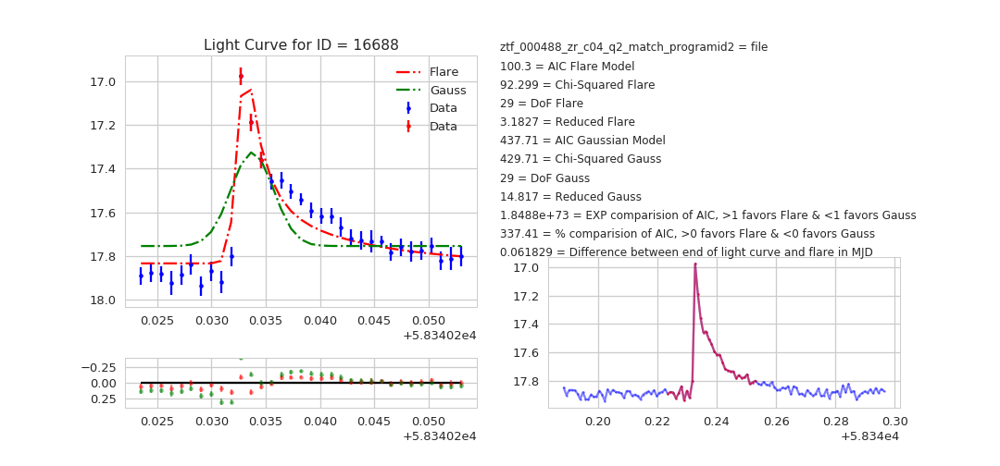

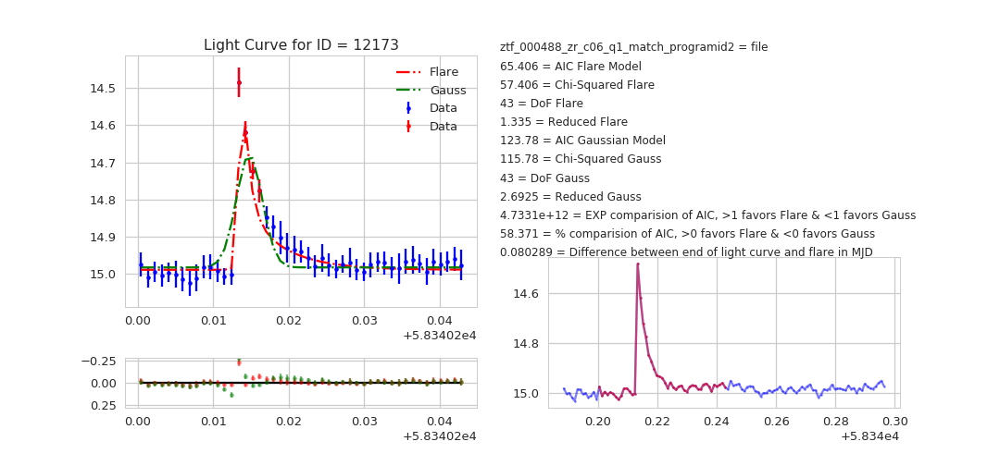

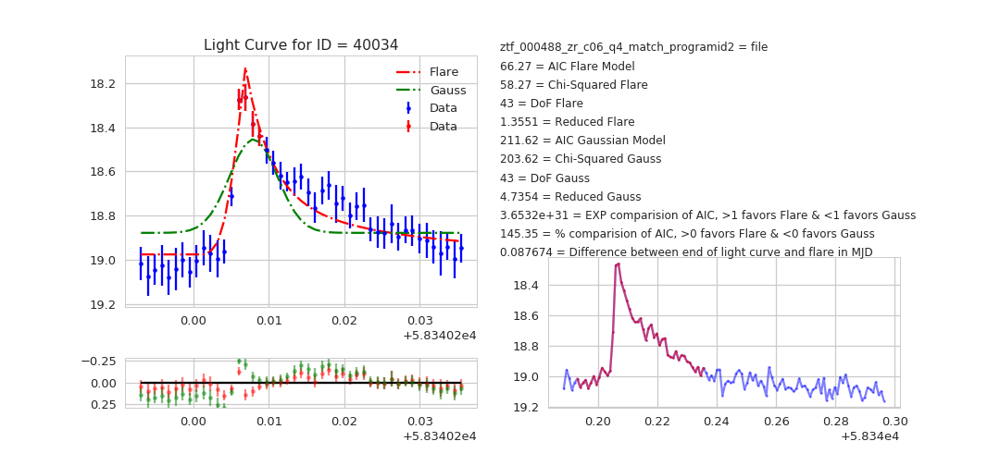

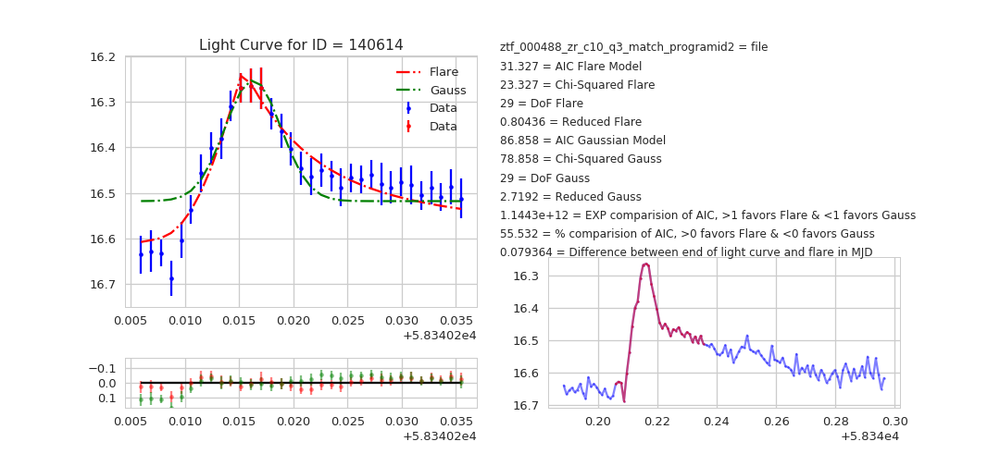

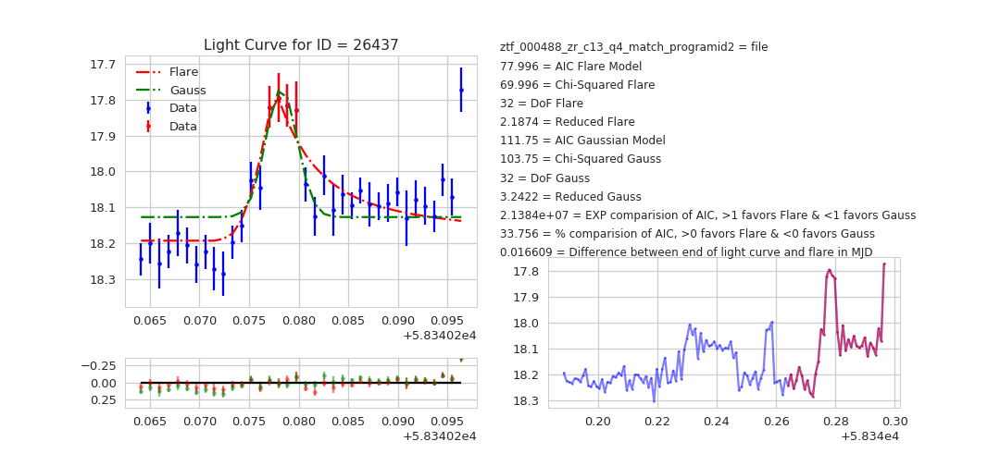

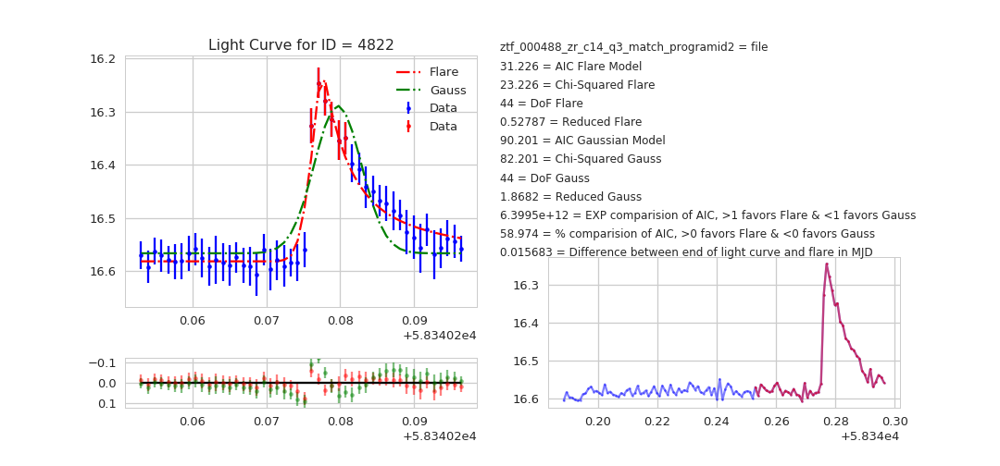

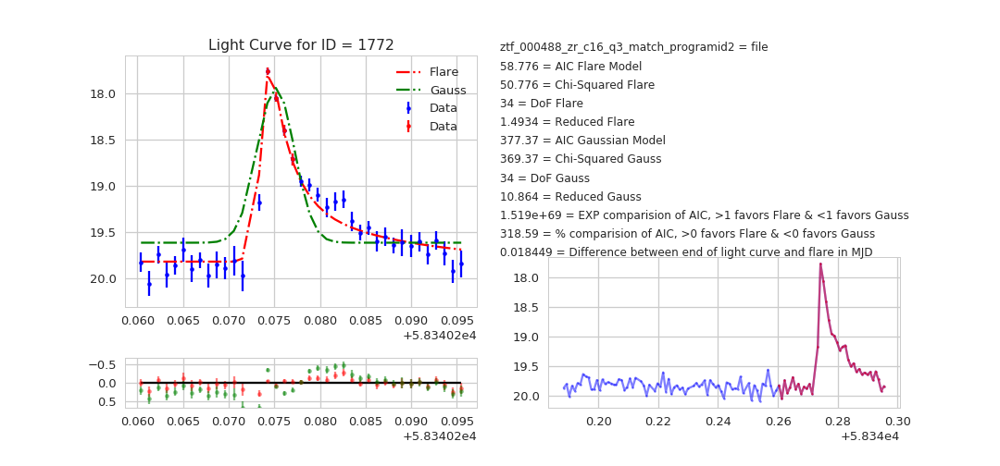

In [316]:
veiwlimitedcurves('found_flares_488/stats_ztf_000488.csv',path='found_flares_488/')

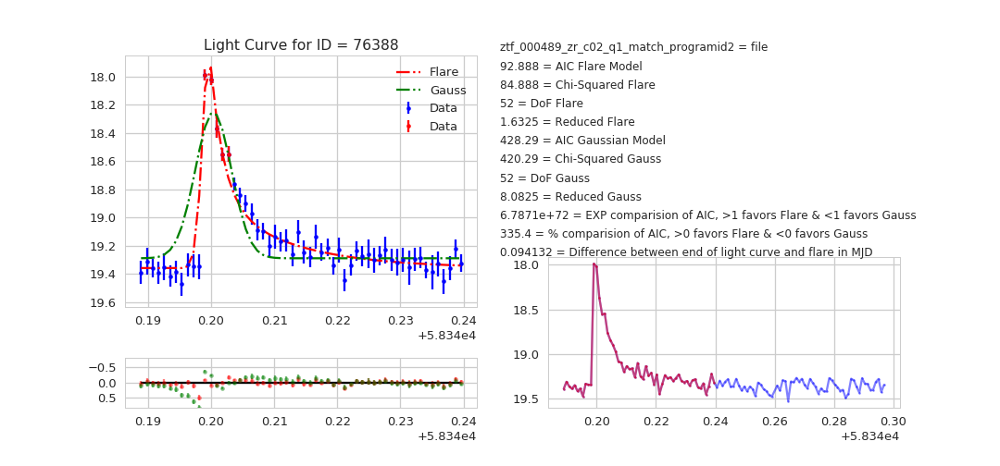

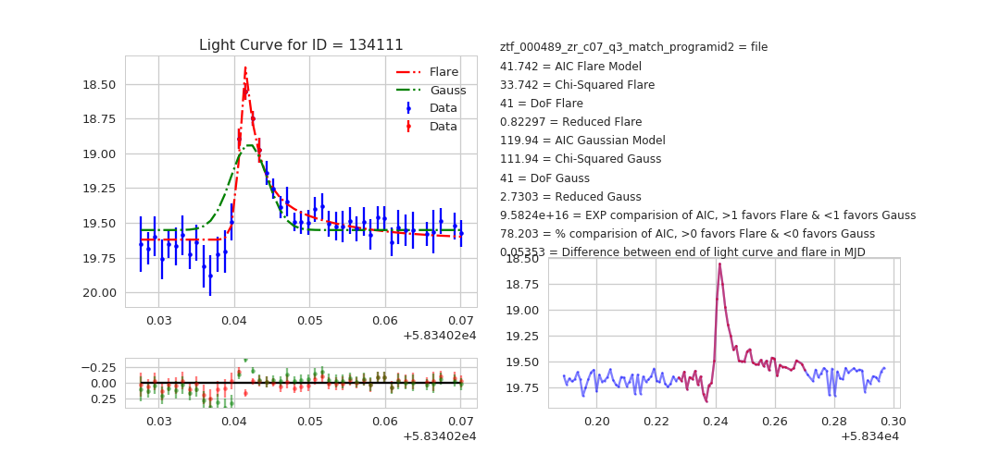

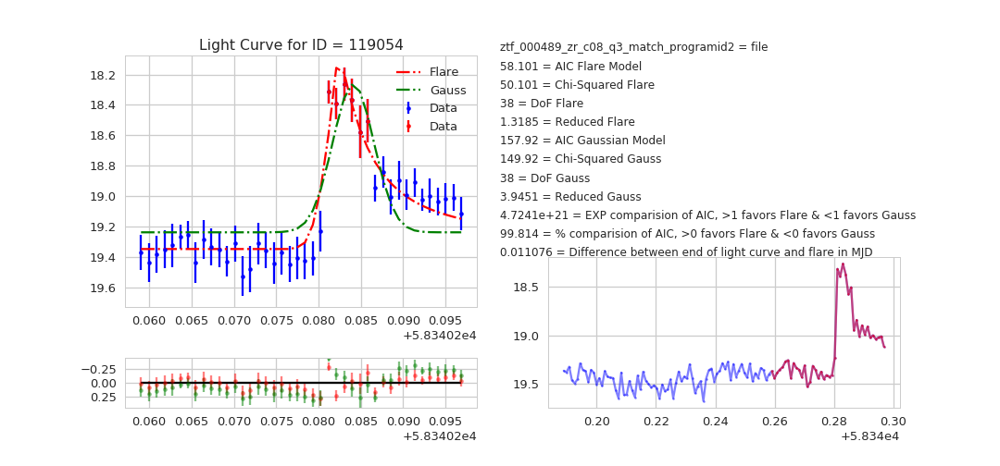

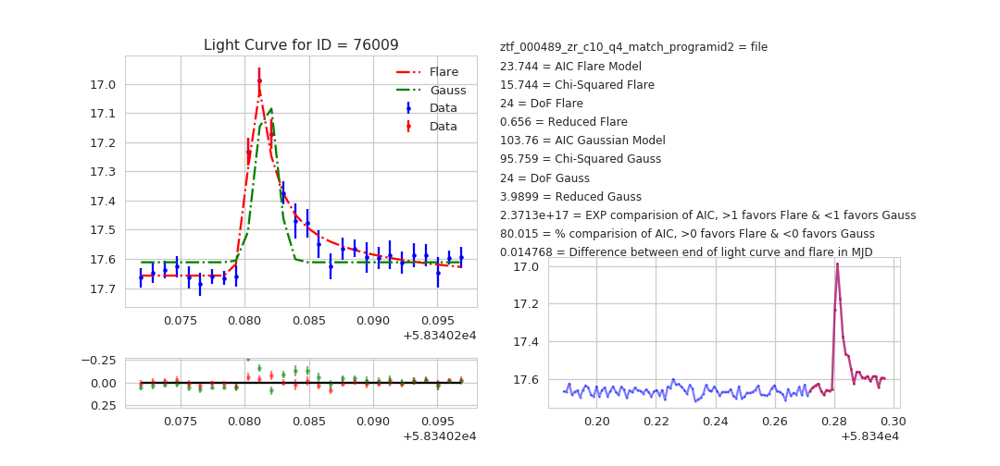

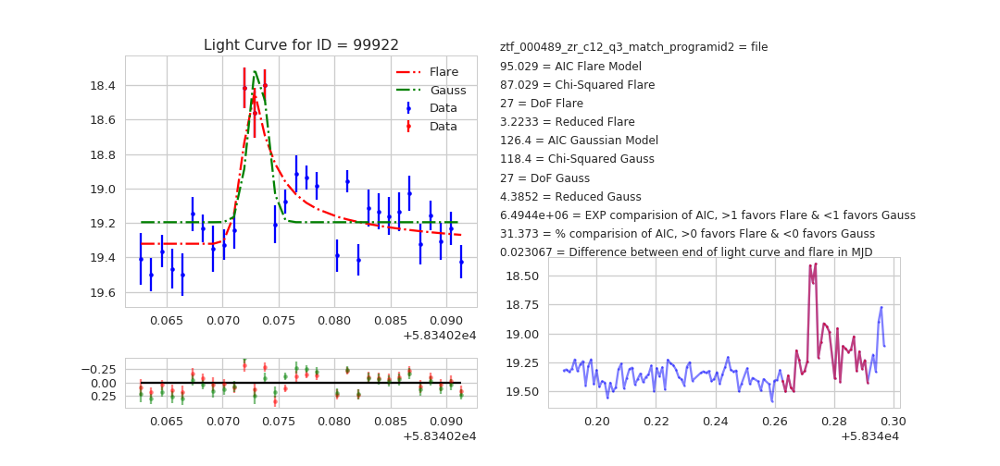

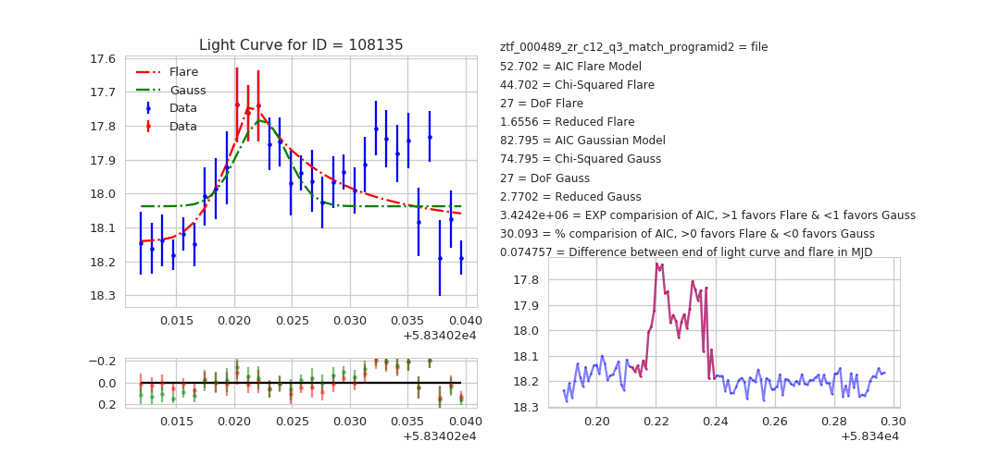

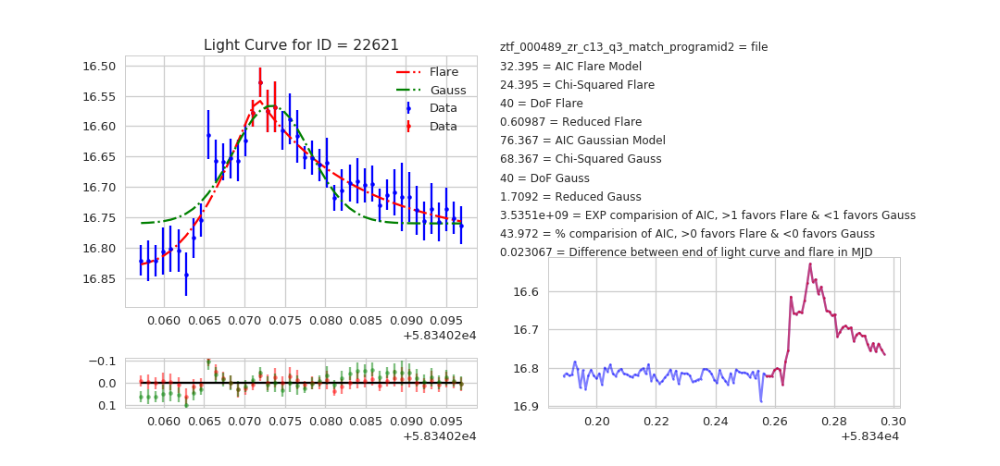

In [317]:
veiwlimitedcurves('found_flares_489/stats_ztf_000489.csv',path='found_flares_489/')

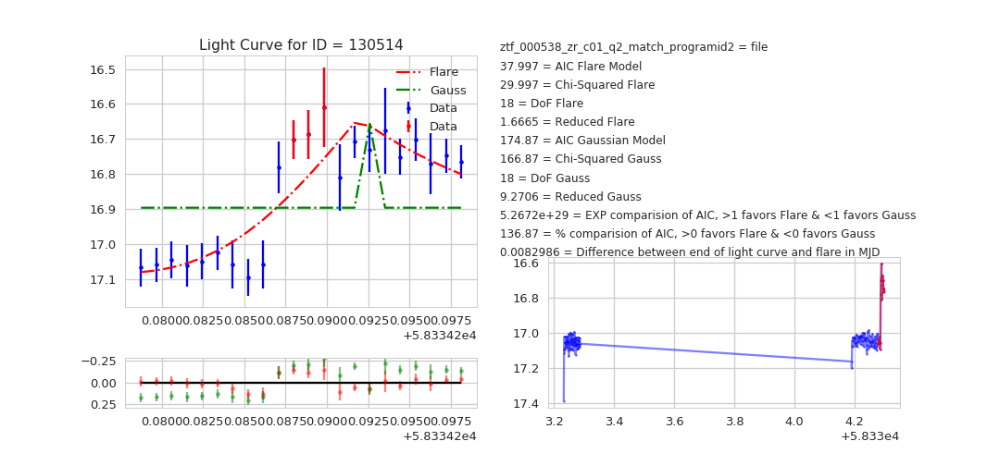

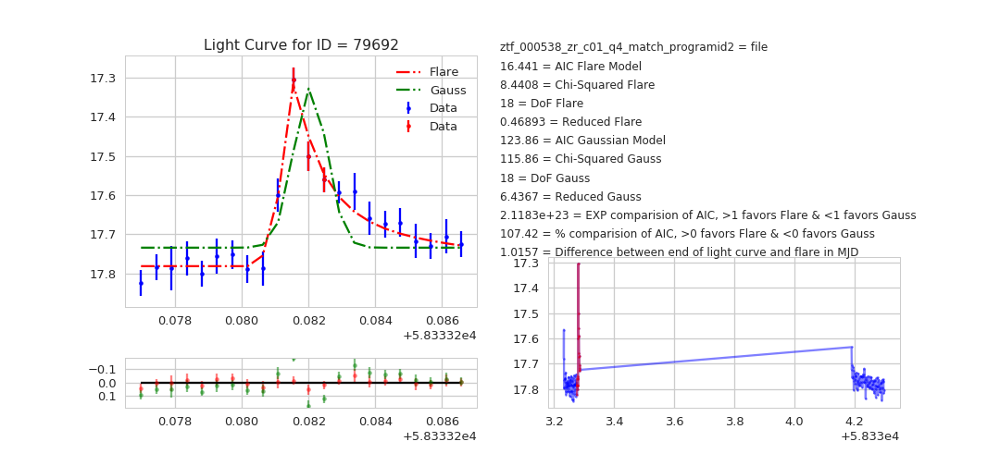

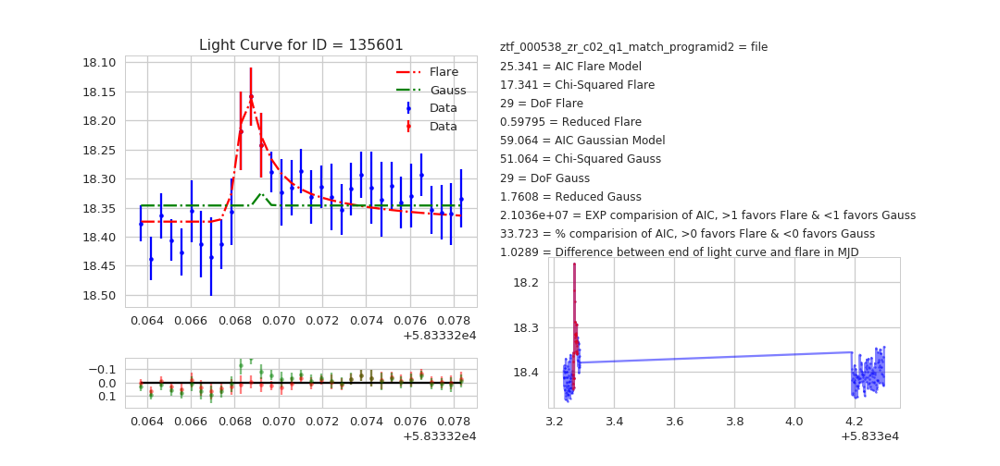

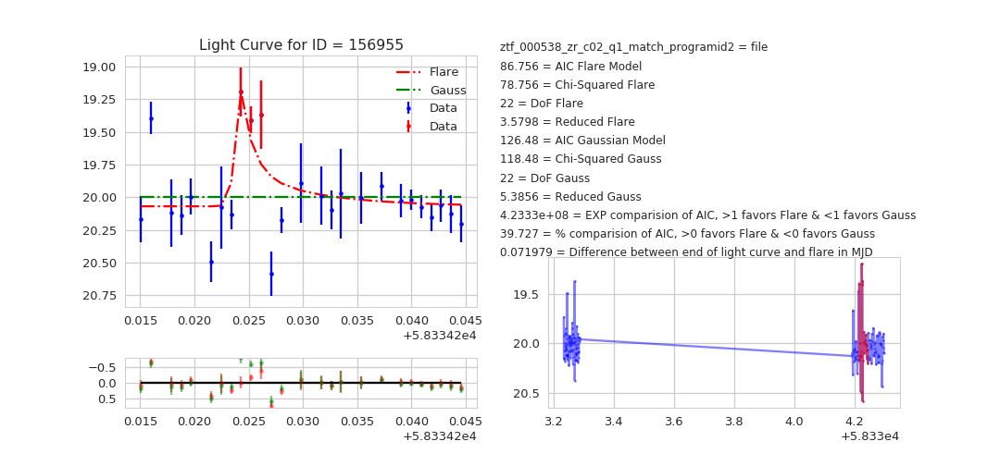

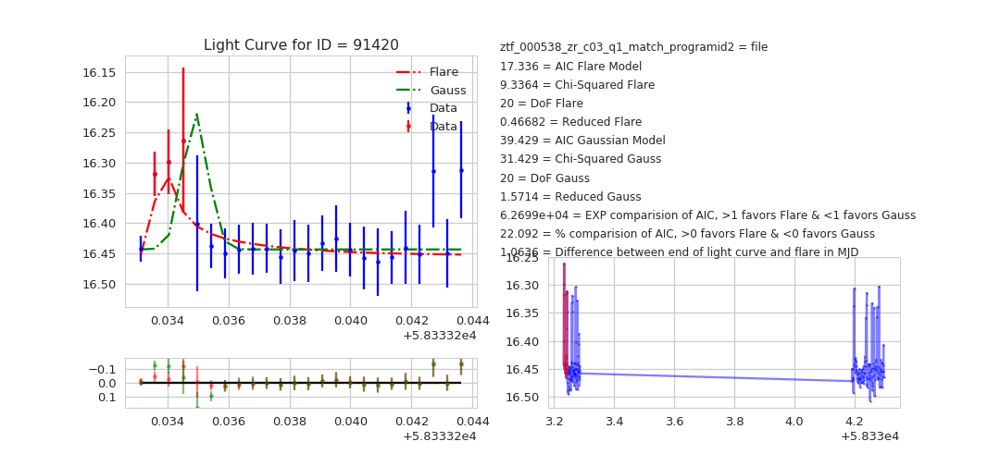

...

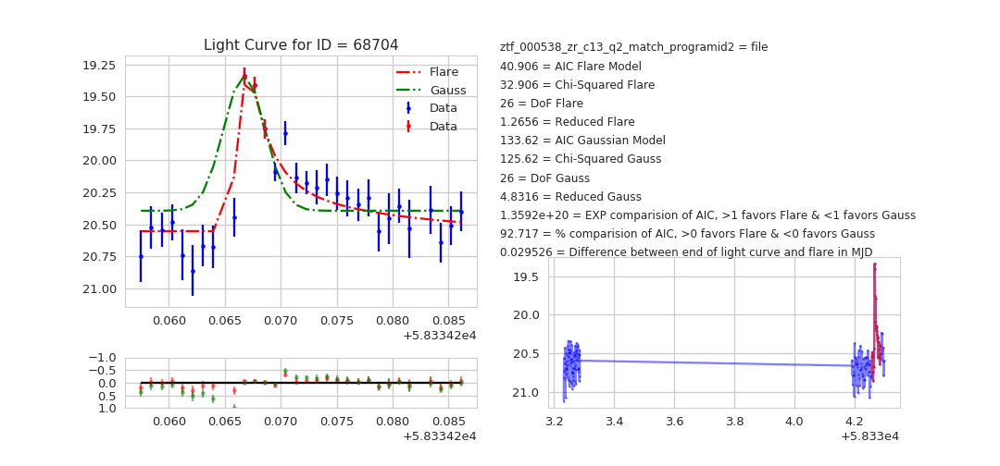

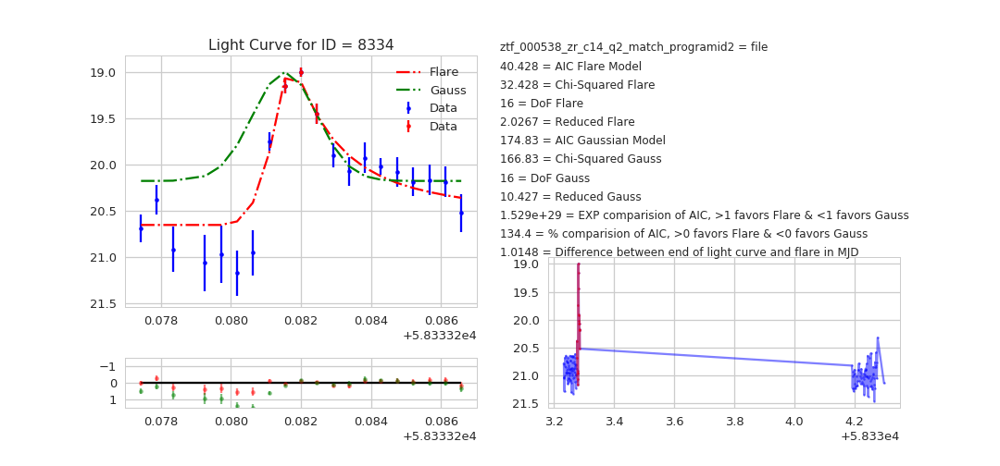

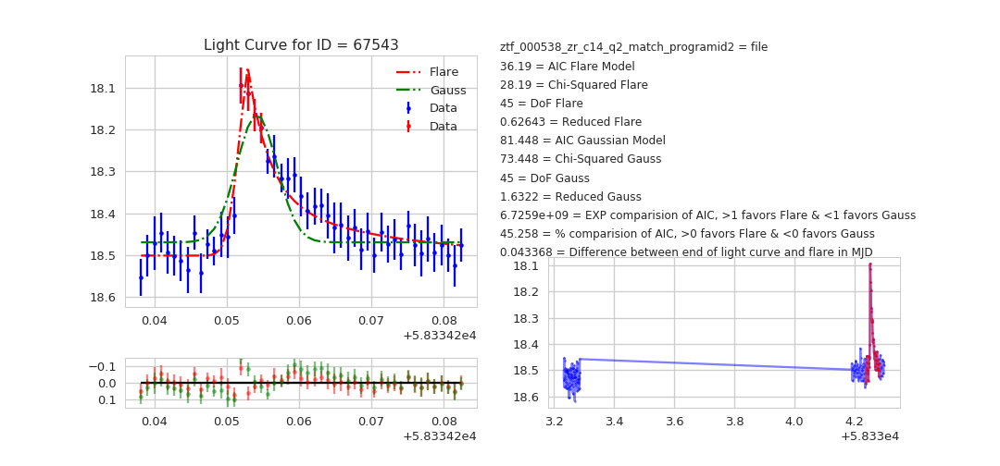

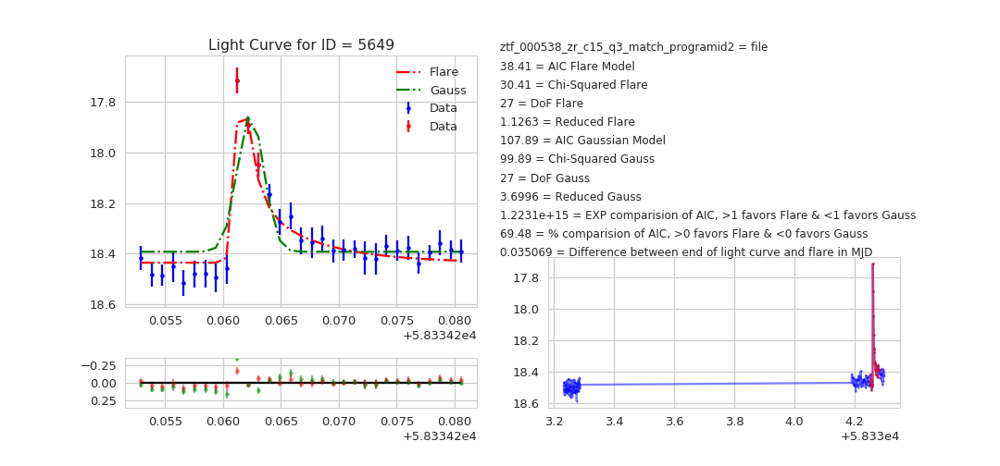

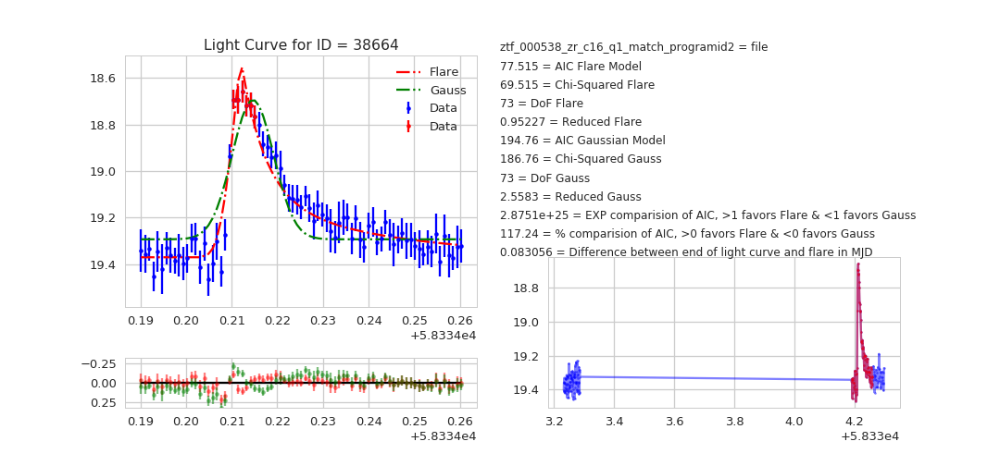

In [320]:
veiwlimitedcurves('found_flares_538/stats_ztf_000538.csv',path='found_flares_538/')

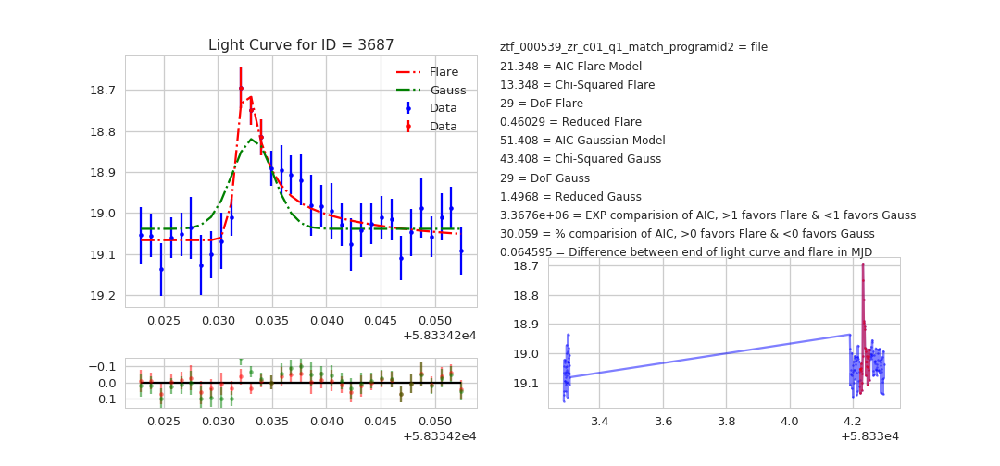

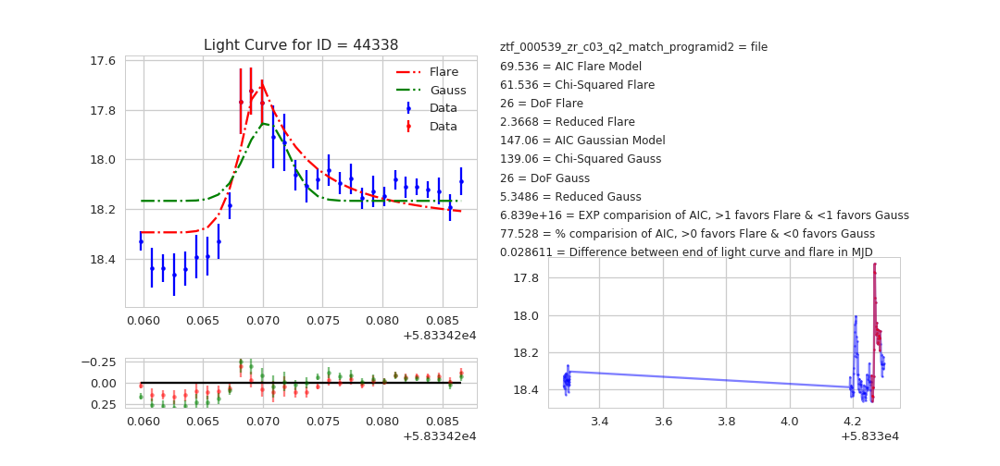

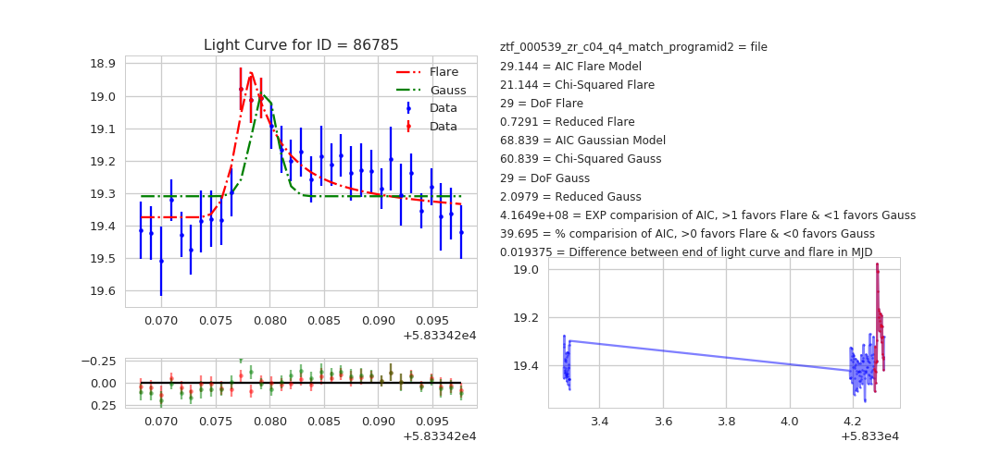

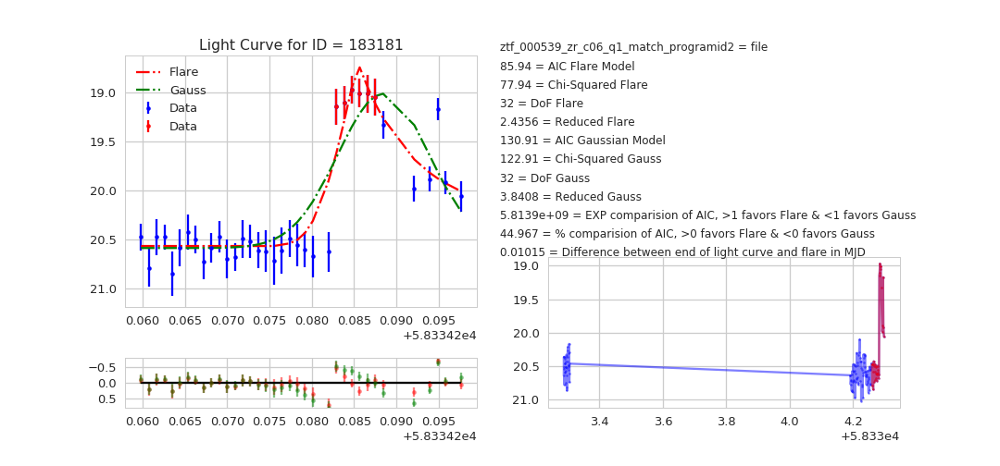

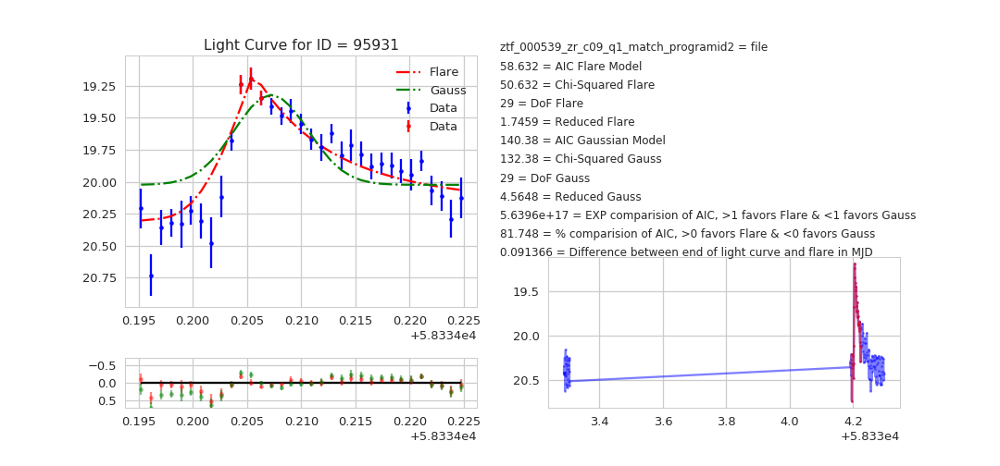

...

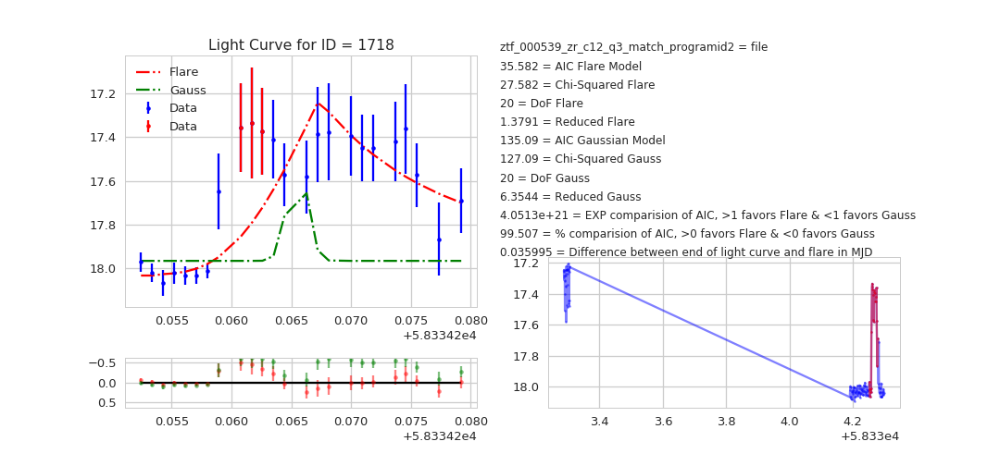

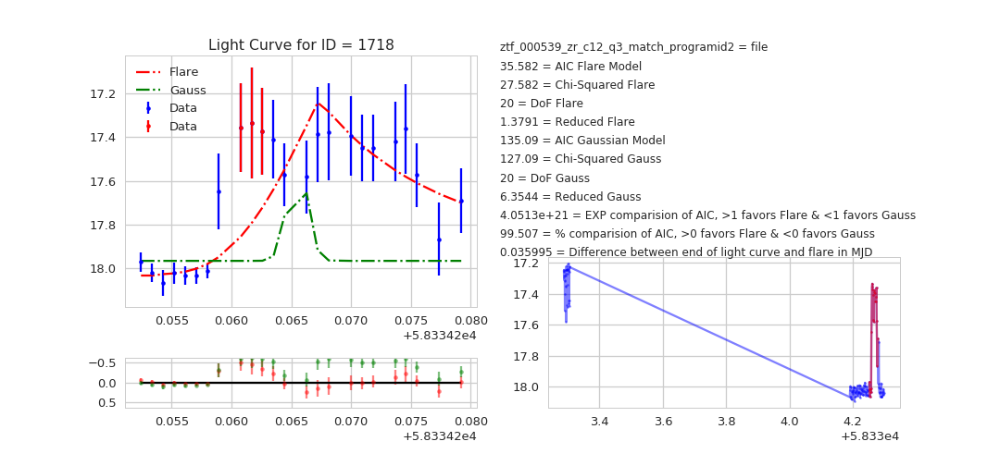

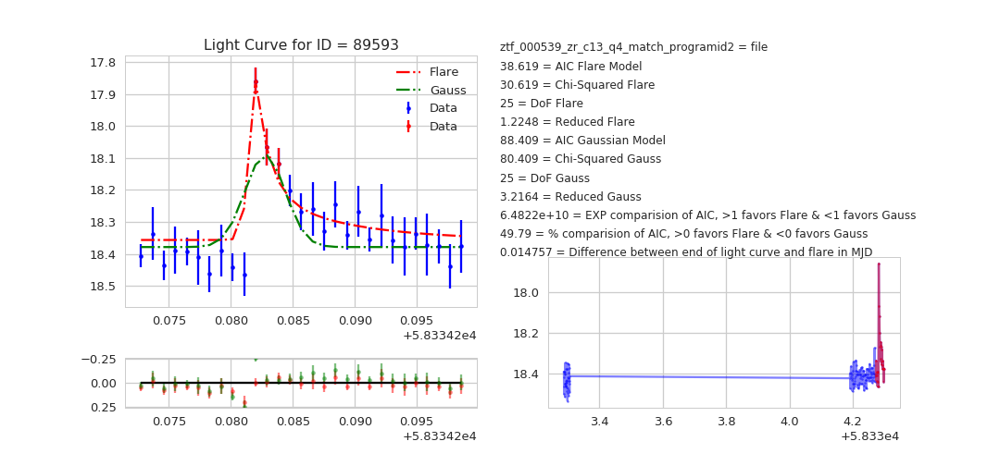

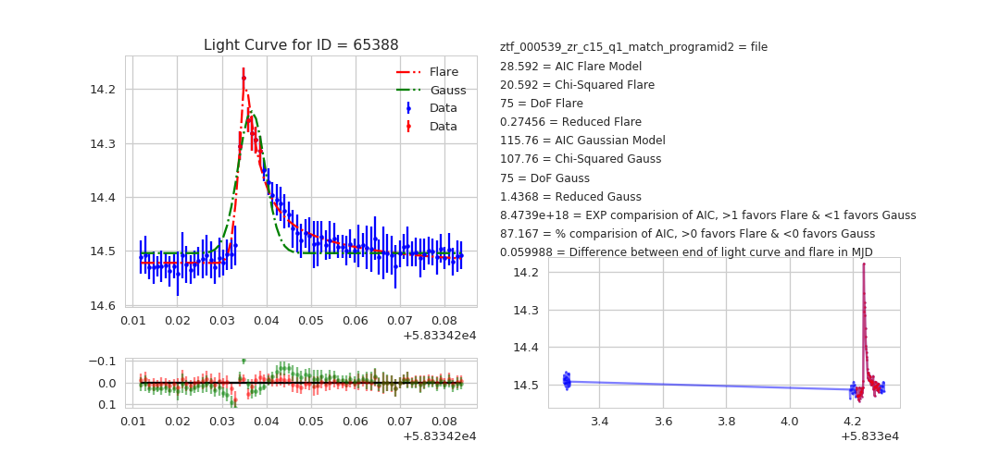

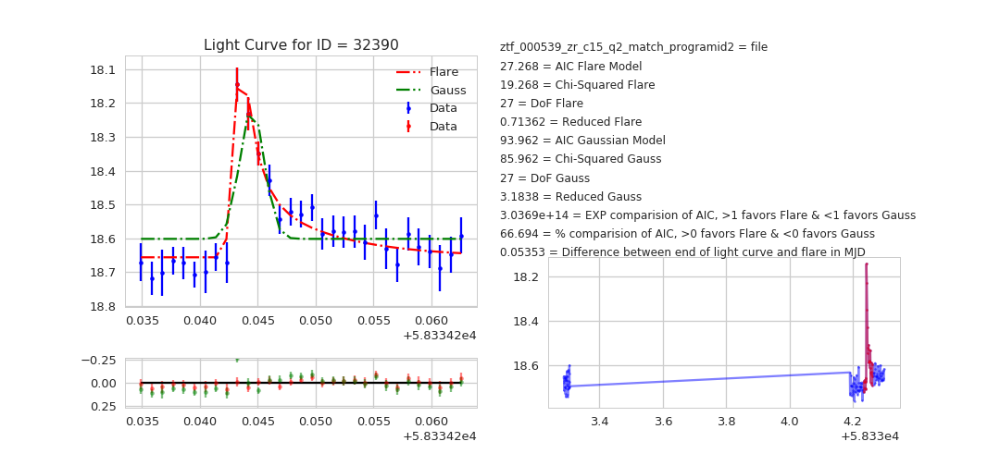

In [329]:
veiwlimitedcurves('found_flares_539/stats_ztf_000539.csv',path='found_flares_539/')

In [325]:
files = ['found_flares_539/stats_ztf_000539.csv',
         'found_flares_436/stats_ztf_000436.csv',
         'found_flares_437/stats_ztf_000437.csv',
         'found_flares_488/stats_ztf_000488.csv',
         'found_flares_538/stats_ztf_000538.csv',
         'found_flares_489/stats_ztf_000489.csv']


In [328]:
outfilename = 'flare_coords.csv'
for i in files:
    lightcurve = pd.read_csv(files)
    if not os.path.isfile(outfilename):
        with open(outfilename, 'a') as csv_file:
            write = csv.writer(csv_file)
            write.writerow(['match_file', 'id', 'ra', 'dec'])
            write.writerow([lightcurve['match_file'], lightcurve['matchid'], 
                            lightcurve['ra'], lightcurve['dec']])

    with open(outfilename, 'a') as csv_file:
        write = csv.writer(csv_file)
        write.writerow([lightcurve['match_file'], lightcurve['matchid'], 
                        lightcurve['ra'], lightcurve['dec']])

ValueError: Invalid file path or buffer object type: <class 'list'>

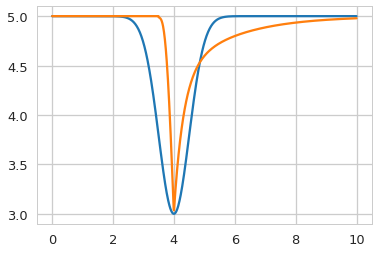

In [85]:
#t, ampl, offset, tpeak, fwhm, 
t = np.linspace(0,10,1000)
y = ms.gaus(t,-2,5,4,.5)
y2 = ms.aflare1(t,2,5,4,.5)

plt.plot(t,y)
plt.plot(t,y2)

In [201]:
def findtransient(lightcurve, N1=3, N2=1, N3=3):
    '''
    Uses the Findflare function to identify spikes in brightness in ZTF lightcurves
    Parameters
    ----------
    lightcurve : pandas dataframe
        A single row from either the sourcedata or transietdata dataframes
        from a ZTF match file.
    N1 : int, optional
        Coefficient from original paper (Default is 3)
        How many times above the stddev is required.
    N2 : int, optional
        Coefficient from original paper (Default is 1)
        How many times above the stddev and uncertainty is required
    N3 : int, optional
        Coefficient from original paper (Default is 3)
        The number of consecutive points required to flag as a flare
    Returns
    -------
    The indices of the times when the magnitude decrease/the source brightness increases
    '''
    dt = np.diff(lightcurve['mjd'])
    #index for boundary points of gaps in the lightcurve
    bpoint = np.where((dt > 0.1))[0] 
    #shifts the boundary point from the beginning of gap to the end of gap
    bpoint += 1
    ''' check in about changing it to -1 '''
    edges = np.concatenate([[0], bpoint, [len(lightcurve)-1]])
    #create a dataframe to put in each set of indx and equivdur
    df = pd.DataFrame(columns=['fl_indx','equivdur'])
    for j in range(len(edges) - 1):
        #searches for a transient in each section of the lightcurve
        trans = ff(lightcurve['mag'][edges[j]:edges[j+1]],
                   lightcurve['magerr'].values[edges[j]:edges[j+1]],
                   N1=N1, N2=N2, N3=N3)
        #if no flare is found len = 0, otherwise is loops over nflares
        for i in range(len(trans[0, :])):
            #trans gives the index in the section, this converts to index in the total lightcurve 
            ntrans_indx = np.arange(edges[j] + trans[0, i],
                               edges[j] + trans[1, i]+1, 1,
                               dtype=np.int)
            print(ntrans_indx)
            #if a transient is identified
            if len(ntrans_indx) > 0:
                dur = (np.nanmax(lightcurve['mjd'].values[ntrans_indx]) - np.nanmin(lightcurve['mjd'].values[ntrans_indx]))
                isflare = np.where((lightcurve['mjd'] >= np.nanmin(lightcurve['mjd'].values[ntrans_indx]) - 3*dur) &
                                   (lightcurve['mjd'] <= np.nanmax(lightcurve['mjd'].values[ntrans_indx]) + 15*dur))[0]
                equiv = matchflare.EquivDur(lightcurve['mjd'].values[isflare],
                                            lightcurve['psfflux'].values[isflare] /np.nanmedian(lightcurve['psfflux']) - 1)
                df = df.append({'fl_indx':ntrans_indx, 'equivdur':equiv}, ignore_index=True)
                
    return df


In [278]:
bp = findtransient(lc_f)
#for index, row in bp.iterrows():
#    print(row['fl_indx'])

#for index, row in bp.iterrows():



[39 40 41]
[100 101 102]


/epyc/opt/anaconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1018: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/epyc/opt/anaconda/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1434: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


(58347.1123495, 58348.4271065)

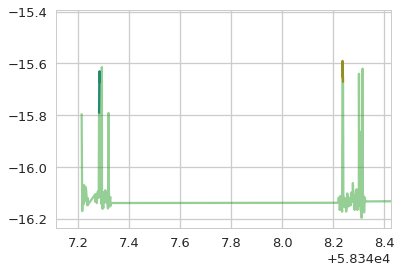

In [276]:
plt.plot(lc_f['mjd'].values[bp['fl_indx'].values[0]],-lc_f['mag'].values[bp['fl_indx'].values[0]])
plt.plot(lc_f['mjd'].values[bp['fl_indx'].values[1]],-lc_f['mag'].values[bp['fl_indx'].values[1]])

plt.plot(lc_f['mjd'],-lc_f['mag'], alpha=.5)
#plt.plot(lc_f['mjd'].values[94:212],-lc_f['mag'].values[94:212])
#plt.plot(lc_f['mjd'].values[28:94],-lc_f['mag'].values[28:94])
#plt.plot(lc_f['mjd'].values[0:212],-lc_f['mag'].values[0:212], color='black', alpha=.5)
plt.xlim(lc_f['mjd'].values[0] - .1,lc_f['mjd'].values[-2] + .1)

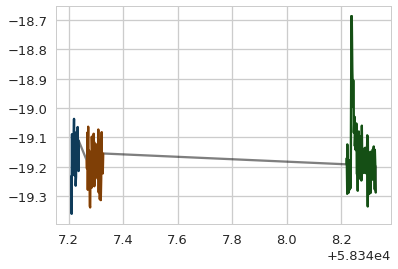

In [211]:
plt.plot(lc['mjd'].values[0:30],-lc['mag'].values[0:30])
plt.plot(lc['mjd'].values[30:97],-lc['mag'].values[30:97])
plt.plot(lc['mjd'].values[97:214],-lc['mag'].values[97:214])

plt.plot(lc['mjd'],-lc['mag'], color='black', alpha=.5)

In [237]:
dt = pd.DataFrame(columns=['fl_indx','equivdur'])
dt

,fl_indx,equivdur


In [264]:
#dt = dt.append({'fl_indx':[7,8,9], 'equivdur':8}, ignore_index=True)
dt

,fl_indx,equivdur
0,"[1, 2, 3]",4
1,"[4, 5, 6]",7
2,"[7, 8, 9]",8


In [277]:
for index, row in bp.iterrows():
    print(row)

fl_indx     [39, 40, 41]
equivdur        -220.164
Name: 0, dtype: object
fl_indx     [100, 101, 102]
equivdur            272.589
Name: 1, dtype: object


In [284]:
print(bp['fl_indx'])

0       [39, 40, 41]
1    [100, 101, 102]
Name: fl_indx, dtype: object


In [285]:
for index, row in bp.iterrows():
    print(type(row['fl_indx']))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [288]:
lc_f['matchid'].values[0]

137953